## EY Data Challenge - Landsat Land Surface Temperature

This  notebook can be used to create a Landsat Land Surface Temperature (LST) product. The notebook creates a cloud-filtered median mosaic for any time period and location and then creates the LST product. A median mosaic reflects the "median" value of pixels for all spectral bands in the time series. When scenes within a time series contain clouds, the use of a median calculation can statistically remove clouds from the final median mosaic product, assuming there are plenty of clear pixels within the time series. The baseline data is [Landsat Collection-2 Level-2](https://www.usgs.gov/landsat-missions/landsat-collection-2) data from the MS Planetary Computer catalog.

In [2]:
# Supress Warnings 
import warnings
warnings.filterwarnings('ignore')

# Import common GIS tools
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import rioxarray as rio
import rasterio
from matplotlib.cm import jet,RdYlGn

# Import Planetary Computer tools
import stackstac
import pystac_client
import planetary_computer 
from odc.stac import stac_load

### Discover and load the data for analysis

First, we define our area of interest using latitude and longitude coordinates. 

In [4]:
# Define the bounding box for the entire data region using (Latitude, Longitude)
# This is the region of New York City that contains our temperature dataset
lower_left = (40.75, -74.01)
upper_right = (40.88, -73.86)

In [5]:
# Calculate the bounds for doing an archive data search
# bounds = (min_lon, min_lat, max_lon, max_lat)
bounds = (lower_left[1], lower_left[0], upper_right[1], upper_right[0])

In [6]:
# Define the time window
# We will use a period of 3 months to search for data
time_window = "2021-01-01/2021-12-01"

Using the `pystac_client` we can search the Planetary Computer's STAC endpoint for items matching our query parameters. The query searches for "low cloud" scenes with overall cloud cover <90%. We will also limit our search to Landsat-8 to avoid the Landsat-7 scan line corrector failure. The result is the number of scenes matching our search criteria that touch our area of interest. Some of these may be partial scenes or contain clouds.

In [8]:
stac = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

search = stac.search(
    bbox=bounds, 
    datetime=time_window,
    collections=["landsat-c2-l2"],
    query={"eo:cloud_cover": {"lt": 90},"platform": {"in": ["landsat-8"]}},
)

In [9]:
items = list(search.get_items())
print('This is the number of scenes that touch our region:',len(items))

This is the number of scenes that touch our region: 47


Next, we'll load the data into an [xarray](https://xarray.pydata.org/en/stable/) DataArray using [stackstac](https://stackstac.readthedocs.io/). We will only keep the commonly used spectral bands (Red, Green, Blue, NIR, Surface Temperature). There are also several other <b>important settings for the data</b>: We have changed the projection to epsg=4326 which is standard latitude-longitude in degrees. We have specified the spatial resolution of each pixel to be 30-meters. 

In [11]:
signed_items = [planetary_computer.sign(item).to_dict() for item in items]

In [12]:
# Define the pixel resolution for the final product
# Define the scale according to our selected crs, so we will use degrees
resolution = 50  # meters per pixel 
scale = resolution / 111320.0 # degrees per pixel for crs=4326 

### Landsat Band Summary 
The following list of bands will be loaded by the Open Data Cube (ODC) stac command:<br>
We will use two load commands to separate the RGB data from the Surface Temperature data.<br><br>
Band 2 = blue = 30m<br>
Band 3 = green = 30m<br>
Band 4 = red = 30m<br>
Band 5 = nir08 (near infrared) = 30m<br>
Band 11 = Surface Temperature = lwir11 = 100m

In [14]:
data1 = stac_load(
    items,
    bands=[
        "coastal",  # B1
        "blue",     # B2
        "green",    # B3
        "red",      # B4
        "nir08",    # B5 (Near-Infrared)
        "swir16",   # B6 (Shortwave Infrared 1)
        "swir22",   # B7 (Shortwave Infrared 2)
      
        
    ],
    crs="EPSG:4326",  # Latitude-Longitude
    resolution=scale,  # Degrees
    chunks={"x": 2048, "y": 2048},
    dtype="uint16",
    patch_url=planetary_computer.sign,
    bbox=bounds
)

In [15]:
data2 = stac_load(
    items,
    bands=["lwir11"],
    crs="EPSG:4326", # Latitude-Longitude
    resolution=scale, # Degrees
    chunks={"x": 2048, "y": 2048},
    dtype="uint16",
    patch_url=planetary_computer.sign,
    bbox=bounds
)

Since the data matching our query isn't too large we can persist it in distributed memory. Once in memory, subsequent operations will be much faster.

In [17]:
# View the dimensions of our XARRAY and the loaded variables
# This insures we have the right coordinates and spectral bands in our xarray
display(data1)
display(data2)

<xarray.Dataset> Size: 64MB
Dimensions:      (latitude: 291, longitude: 335, time: 47)
Coordinates:
  * latitude     (latitude) float64 2kB 40.88 40.88 40.88 ... 40.75 40.75 40.75
  * longitude    (longitude) float64 3kB -74.01 -74.01 -74.01 ... -73.86 -73.86
    spatial_ref  int32 4B 4326
  * time         (time) datetime64[ns] 376B 2021-01-07T15:33:55.645684 ... 20...
Data variables:
    coastal      (time, latitude, longitude) uint16 9MB dask.array<chunksize=(1, 291, 335), meta=np.ndarray>
    blue         (time, latitude, longitude) uint16 9MB dask.array<chunksize=(1, 291, 335), meta=np.ndarray>
    green        (time, latitude, longitude) uint16 9MB dask.array<chunksize=(1, 291, 335), meta=np.ndarray>
    red          (time, latitude, longitude) uint16 9MB dask.array<chunksize=(1, 291, 335), meta=np.ndarray>
    nir08        (time, latitude, longitude) uint16 9MB dask.array<chunksize=(1, 291, 335), meta=np.ndarray>
    swir16       (time, latitude, longitude) uint16 9MB dask.array<chunksize=(1, 291, 335), meta=np.ndarray>
    swir22       (time, latitude, longitude) uint16 9MB dask.array<chunksize=(1, 291, 335), meta=np.ndarray>

<xarray.Dataset> Size: 9MB
Dimensions:      (latitude: 291, longitude: 335, time: 47)
Coordinates:
  * latitude     (latitude) float64 2kB 40.88 40.88 40.88 ... 40.75 40.75 40.75
  * longitude    (longitude) float64 3kB -74.01 -74.01 -74.01 ... -73.86 -73.86
    spatial_ref  int32 4B 4326
  * time         (time) datetime64[ns] 376B 2021-01-07T15:33:55.645684 ... 20...
Data variables:
    lwir11       (time, latitude, longitude) uint16 9MB dask.array<chunksize=(1, 291, 335), meta=np.ndarray>

In [18]:
# Persist the data in memory for faster operations
data1 = data1.persist()
data2 = data2.persist()

### Scaling Datasets
Landsat Collection-2 Level-2 products require scaling before creating valid output products. <br>
Scale factors for the RGB and NIR bands differ from scale factors for the Surface Temperature band.<br>

In [20]:
# Scale Factors for the RGB and NIR bands 
scale1 = 0.0000275 
offset1 = -0.2 
data1 = data1.astype(float) * scale1 + offset1

In [21]:
# Scale Factors for the Surface Temperature band
scale2 = 0.00341802 
offset2 = 149.0 
kelvin_celsius = 273.15 # convert from Kelvin to Celsius
data2 = data2.astype(float) * scale2 + offset2 - kelvin_celsius

### View RGB (real color) images from the time series
You will notice that some of the scenes have clouds and some of the scenes have missing data due to scene boundary issues. Since Landsat is a descending orbit path across the equator, the time of acquisition for the scenes below is about 11:30am local time (note the time on the image is UTC time). Also, these images are merely for quick review and are not scaled correctly to reflect the proper Lat-Lon ratios. 

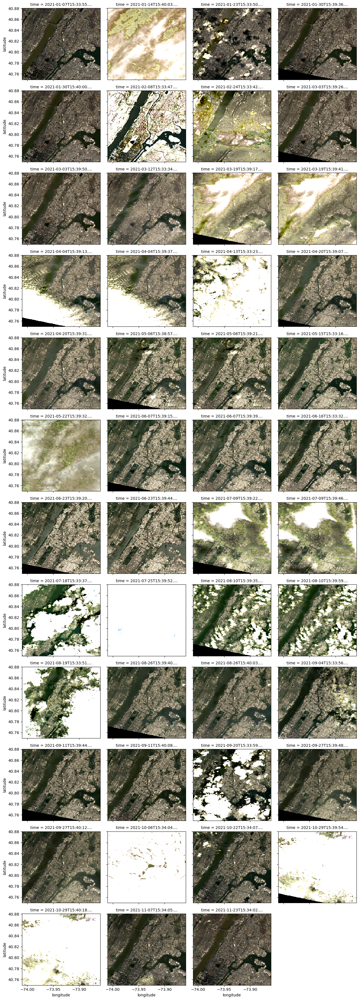

In [23]:
plot_data = data1[["red","green","blue"]].to_array()
plot_data.plot.imshow(col='time', col_wrap=4, robust=True, vmin=0, vmax=0.25)
plt.show()

### Output Products
Gonna find the median for the data . same thing we did with sentinel

In [25]:
median_spectralbands = data1.median(dim="time").compute()

In [26]:
median_LST = data2.median(dim="time").compute()

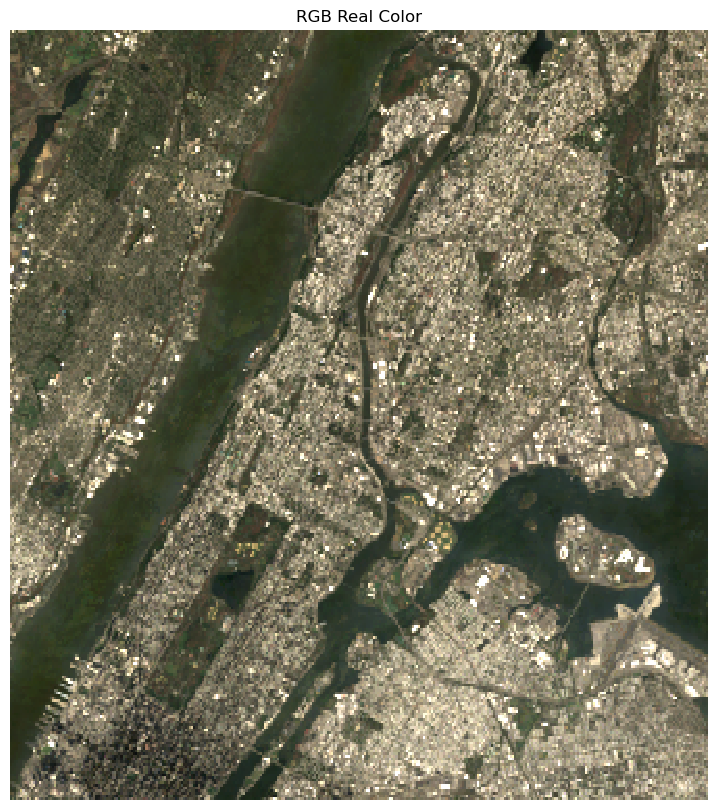

In [27]:
# Plot an RGB Real Color Image for a single date
fig, ax = plt.subplots(figsize=(9,10))
median_spectralbands[["red", "green", "blue"]].to_array().plot.imshow(robust=True, ax=ax, vmin=0.0, vmax=0.25)
ax.set_title("RGB Real Color")
ax.axis('off')
plt.show()

# Plot an RGB Real Color Image for a single date
fig, ax = plt.subplots(figsize=(9,10))
median_LST[["lwir11"]].to_array().plot.imshow(robust=True, ax=ax, vmin=0.0, vmax=0.25)
ax.set_title("LST ")
ax.axis('off')
plt.show()

The <b>Normalized Difference Vegetation Index (NDVI)</b> is used to measure the "greenness" of vegetation and has a range of 0.0 to 1.0. Low values (0.0 to 0.25) reflect a lack of vegetation (bare soil, urban, water), middle values (0.25 to 0.6) reflect grasslands or croplands in their growing state, and high values (0.6 to 1.0) reflect dense vegetation such as trees or croplands at their peak vegetation state. Such information can be relevant to modeling urban heating as the proximity to vegetation or "green space" can mitigate urban heating. The equation uses two spectral bands where: <b>NDVI = (NIR-Red) / (NIR+Red).

# Calculate NDVI for the median mosaic
ndvi_data = (data1.isel(time=scene).nir08-data1.isel(time=scene).red)/(data1.isel(time=scene).nir08+data1.isel(time=scene).red)

### Landsat Surface Temperature

### Save the output data in a GeoTIFF file

#### - Save the LST band in a GeoTIff file 

In [34]:
filename = "Landsat_LST.tiff"

In [35]:
# Calculate the dimensions of the file
height = median_LST.dims["latitude"]
width = median_LST.dims["longitude"]

In [36]:
# Define the Coordinate Reference System (CRS) to be common Lat-Lon coordinates
# Define the tranformation using our bounding box so the Lat-Lon information is written to the GeoTIFF
gt = rasterio.transform.from_bounds(lower_left[1],lower_left[0],upper_right[1],upper_right[0],width,height)
median_LST.rio.write_crs("epsg:4326", inplace=True)
median_LST.rio.write_transform(transform=gt, inplace=True);

In [37]:
# Create the GeoTIFF output file using the defined parameters 
with rasterio.open(filename,'w',driver='GTiff',width=width,height=height,
                   crs='epsg:4326',transform=gt,count=1,compress='lzw',dtype='float64') as dst:
    dst.write(median_LST.lwir11,1)
    dst.close()

#### - Save the Spectral band in a GeoTIff file 

In [39]:
filename = "Landsat_bands1.tiff"

In [40]:
# Calculate the dimensions of the file
height = median_spectralbands.dims["latitude"]
width = median_spectralbands.dims["longitude"]

In [41]:
# Define the Coordinate Reference System (CRS) to be common Lat-Lon coordinates
# Define the tranformation using our bounding box so the Lat-Lon information is written to the GeoTIFF
gt = rasterio.transform.from_bounds(lower_left[1],lower_left[0],upper_right[1],upper_right[0],width,height)
median_spectralbands.rio.write_crs("epsg:4326", inplace=True)
median_spectralbands.rio.write_transform(transform=gt, inplace=True);

In [42]:
# Create the GeoTIFF output file using the defined parameters 
with rasterio.open(filename,'w',driver='GTiff',width=width,height=height,
                   crs='epsg:4326',transform=gt,count=7,compress='lzw',dtype='float64') as dst:
    dst.write(median_spectralbands.coastal.values, 1)  # Band 1 - Coastal
    dst.write(median_spectralbands.blue.values, 2)     # Band 2 - Blue
    dst.write(median_spectralbands.green.values, 3)    # Band 3 - Green
    dst.write(median_spectralbands.red.values, 4)      # Band 4 - Red
    dst.write(median_spectralbands.nir08.values, 5)    # Band 5 - Near-Infrared
    dst.write(median_spectralbands.swir16.values, 6)   # Band 6 - SWIR1
    dst.write(median_spectralbands.swir22.values, 7)   # Band 7 - SWIR2
    